In [16]:
4000+4

4004

In [17]:
print("RRA_Think Differently, Create history’s next line.")

RRA_Think Differently, Create history’s next line.


Description of the Code:
This Python script is designed to apply various colorization techniques to medical images (such as CT scans or X-ray images), enhancing their visual appeal and providing multiple perspectives for analysis. The code utilizes the following methods to process the images:

Basic Color Map Application: This method applies a color map to the grayscale image, enhancing its visibility and creating a more visually appealing output. The 'jet' color map is used by default.

Adaptive Histogram Equalization: A technique to improve image contrast using CLAHE (Contrast Limited Adaptive Histogram Equalization), which is particularly useful in medical imaging to enhance subtle details.

Contrast Stretching: This method stretches the contrast of the grayscale image to cover the full range of pixel values, making the features in the image more distinguishable.

Gaussian Blur: This method smooths the image by applying a Gaussian filter. It reduces noise and detail, which can be useful for visualizing general patterns.

Edge Detection (Canny Edge Detector): This method detects edges in the image, emphasizing areas where there is a significant change in intensity.

Random Color Palette: This technique overlays random color palettes on the grayscale image, which can be useful for data exploration or visual representation of medical scans.

Gamma Correction: This non-linear technique adjusts the brightness of the image, improving the visual perception of details.

LUT (Lookup Table) Color Mapping: This method applies a predefined color map to the image, such as 'plasma,' which is designed to enhance the appearance of specific features.

Alpha Blending (Threshold-based): This method uses a threshold to identify important areas in the image and then blends them with the original image, allowing for improved focus on specific features.

3D Rendering: Though this method is a placeholder for 3D visualizations, it applies a color map to the 2D image to simulate a 3D effect.

Heatmap Visualization: This method creates a heatmap-like effect, useful for visualizing areas of interest or anomalies, particularly in the context of medical anomaly detection.

3D Volume Rendering: Another placeholder for 3D rendering techniques, this method applies a color map to simulate 3D rendering effects.

Interactive Segmentation: This technique segments regions of interest within the image and colorizes them to highlight different features or anomalies.

Who Can Use This Code:
This code is beneficial for professionals working in the medical imaging domain, such as:

Radiologists: The enhanced visualizations can help radiologists identify critical features in CT scans and X-ray images more easily.

Medical Researchers: Researchers exploring new methods in medical imaging and image processing can apply this code to a variety of medical datasets to assist in data analysis.

Data Scientists: Data scientists working with medical datasets can use this code to preprocess medical images before feeding them into machine learning models or AI systems.

Medical Software Developers: Developers building medical imaging software can incorporate these techniques for visualization and image enhancement.

Healthcare Institutions and Hospitals: Healthcare providers can use these colorized images for better diagnosis and patient care analysis.

Code Functionality:
Input and Output:

Input Directory: The input directory should contain medical images, such as CT scans or X-ray images.
Output Directory: The processed and colorized images are saved to this directory. Each method's results are organized in their own respective folder.
Processing Each Image:

The code loops through all images in the input directory and applies the colorization methods mentioned above.
After processing, the colorized images are saved in the output directory under different folders corresponding to each method.
Future Work:
Integration with Deep Learning Models: The colorized images can be fed into deep learning models for further analysis, such as anomaly detection, segmentation, or classification tasks.

Improved 3D Rendering: Future work could include implementing true 3D volume rendering techniques using libraries like VTK or PyVista for better medical imaging analysis.

Real-Time Image Processing: With the use of GPU acceleration (e.g., using TensorFlow or PyTorch), real-time processing of medical images could be achieved.

Anomaly Detection: The methods like heatmap visualization can be used in anomaly detection models to highlight suspicious areas in medical images for further analysis by doctors.

Automated Segmentation: Future developments could include applying machine learning-based segmentation to automate the process of identifying and isolating regions of interest in medical images.

How to Use This Code for Medical Imaging (X-ray/CT Scan):
Download Medical Datasets: You can download medical image datasets such as X-ray and CT scan from Kaggle (e.g., Chest CTScan Images, Computed Tomography of the Brain, etc.).

Preprocess Images: The code will process each image by applying various colorization and enhancement techniques, making the analysis of features in CT scans or X-ray images easier.

Visualize Enhanced Images: The resulting colorized images can be analyzed visually, helping radiologists or medical professionals better understand and interpret the data.

Save and Share Results: The colorized images can be saved in the output directory, and the enhanced images can be used for further medical diagnosis or shared with medical teams for collaborative analysis.



In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from PIL import Image
import cv2

# Define input and output directories
input_directory = r'F:\MLpractrice\ct\data'
output_directory = r'F:\MLpractrice\ct\output'

# Create the output directory if it doesn't exist
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

# Method 1: Basic Color Map Application
def apply_color_map(ct_image, cmap='jet'):
    ct_image_normalized = (ct_image - np.min(ct_image)) / (np.max(ct_image) - np.min(ct_image))
    colored_image = cm.get_cmap(cmap)(ct_image_normalized)
    return (colored_image[:, :, :3] * 255).astype(np.uint8)

# Method 2: Adaptive Histogram Equalization with Color Map
def apply_adaptive_hist_eq(ct_image):
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced_image = clahe.apply(ct_image)
    return apply_color_map(enhanced_image)

# Method 3: Contrast Stretching with Color Map
def apply_contrast_stretching(ct_image):
    min_val, max_val = np.min(ct_image), np.max(ct_image)
    stretched_image = (ct_image - min_val) / (max_val - min_val)
    return apply_color_map(stretched_image)

# Method 4: Gaussian Blur with Color Map
def apply_gaussian_blur(ct_image):
    blurred_image = cv2.GaussianBlur(ct_image, (5, 5), 0)
    return apply_color_map(blurred_image)

# Method 5: Edge Detection with Canny and Color Map
def apply_edge_detection(ct_image):
    edges = cv2.Canny(ct_image, 100, 200)
    return apply_color_map(edges)

# Method 6: Random Color Palettes (Color Overlay)
def apply_random_color_palette(ct_image):
    random_colored = np.random.rand(*ct_image.shape, 3)
    colored_image = ct_image[:, :, None] * random_colored
    return (colored_image * 255).astype(np.uint8)

# Method 7: Non-Linear Color Stretching (Gamma Correction)
def apply_gamma_correction(ct_image, gamma=1.2):
    gamma_corrected = np.power(ct_image / float(np.max(ct_image)), gamma) * 255
    return apply_color_map(gamma_corrected)

# Method 8: LUT (Lookup Table) Color Mapping (Use predefined LUT)
def apply_lut_color_map(ct_image):
    colored_image = cm.plasma((ct_image - np.min(ct_image)) / (np.max(ct_image) - np.min(ct_image)))
    return (colored_image[:, :, :3] * 255).astype(np.uint8)

# Method 9: Alpha Blending (Threshold-based)
def apply_alpha_blending(ct_image):
    thresholded_image = ct_image > 100
    colored_image = apply_color_map(ct_image)
    thresholded_image_rgb = np.stack([thresholded_image] * 3, axis=-1)
    alpha = 0.5
    final_image = alpha * colored_image + (1 - alpha) * thresholded_image_rgb * 255
    return final_image.astype(np.uint8)

# Method 10: 3D Rendering (Placeholder for 2D images)
def apply_3d_rendering(ct_image):
    return apply_color_map(ct_image)

# Method 11: Heatmap Visualization for Anomaly Detection
def apply_heatmap(ct_image):
    heatmap_image = cm.hot((ct_image - np.min(ct_image)) / (np.max(ct_image) - np.min(ct_image)))
    return (heatmap_image[:, :, :3] * 255).astype(np.uint8)

# Method 12: 3D Volume Rendering (Placeholder for 3D visualization)
def apply_3d_volume_rendering(ct_image):
    return apply_color_map(ct_image)

# Method 13: Interactive Visualization with Segmented Regions
def apply_interactive_visualization(ct_image):
    segmented_image = ct_image > 100
    segmented_colored = cm.plasma(segmented_image.astype(np.float32))
    return (segmented_colored[:, :, :3] * 255).astype(np.uint8)

# Traverse the input directory and process each image in the subfolders
for root, dirs, files in os.walk(input_directory):
    # For each image file in the directory
    for image_file in files:
        if image_file.endswith('.jpg') or image_file.endswith('.png'):
            try:
                # Construct the full input path for the image
                image_path = os.path.join(root, image_file)
                
                # Load the image using PIL
                image = Image.open(image_path)
                
                # Convert image to grayscale
                ct_image = np.array(image.convert('L'))  # Convert to grayscale
                
                # Create the same folder structure in the output directory
                relative_path = os.path.relpath(root, input_directory)  # Get relative folder structure
                output_folder = os.path.join(output_directory, relative_path)
                if not os.path.exists(output_folder):
                    os.makedirs(output_folder)

                # Define a method-to-folder mapping for naming purposes
                method_folders = [
                    "Basic_Color_Map",
                    "Adaptive_Histogram_Equalization",
                    "Contrast_Stretching",
                    "Gaussian_Blur",
                    "Edge_Detection",
                    "Random_Color_Palette",
                    "Gamma_Correction",
                    "LUT_Color_Map",
                    "Alpha_Blending",
                    "3D_Rendering",
                    "Heatmap_Visualization",
                    "3D_Volume_Rendering",
                    "Interactive_Segmentation"
                ]
                
                # Save images in their respective method folders
                for idx, method in enumerate([apply_color_map,
                                              apply_adaptive_hist_eq,
                                              apply_contrast_stretching,
                                              apply_gaussian_blur,
                                              apply_edge_detection,
                                              apply_random_color_palette,
                                              apply_gamma_correction,
                                              apply_lut_color_map,
                                              apply_alpha_blending,
                                              apply_3d_rendering,
                                              apply_heatmap,
                                              apply_3d_volume_rendering,
                                              apply_interactive_visualization]):
                    # Create method folder if it doesn't exist
                    method_folder = os.path.join(output_folder, method_folders[idx])
                    if not os.path.exists(method_folder):
                        os.makedirs(method_folder)
                    
                    # Apply the method to the image
                    result_image = method(ct_image)
                    
                    # Save the image with a sequential number in the method folder
                    image_name_without_extension = os.path.splitext(image_file)[0]
                    output_image_path = os.path.join(method_folder, f"{image_name_without_extension}_{idx+1}.jpg")
                    Image.fromarray(result_image).save(output_image_path, format='JPEG')
                    print(f"Processed and saved {image_file} with method '{method_folders[idx]}' as {output_image_path}")
            
            except Exception as e:
                print(f"Error processing {image_file} in {root}: {e}")

print("Processing complete.")


In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from PIL import Image
import cv2

# Define input and output directories
input_directory = r'F:\MLpractrice\ct\data2'
output_directory = r'F:\MLpractrice\ct\output'

# Create the output directory if it doesn't exist
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

# Method 1: Basic Color Map Application
def apply_color_map(ct_image, cmap='jet'):
    ct_image_normalized = (ct_image - np.min(ct_image)) / (np.max(ct_image) - np.min(ct_image))
    colored_image = cm.get_cmap(cmap)(ct_image_normalized)
    return (colored_image[:, :, :3] * 255).astype(np.uint8)

# Method 2: Adaptive Histogram Equalization with Color Map
def apply_adaptive_hist_eq(ct_image):
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced_image = clahe.apply(ct_image)
    return apply_color_map(enhanced_image)

# Method 3: Contrast Stretching with Color Map
def apply_contrast_stretching(ct_image):
    min_val, max_val = np.min(ct_image), np.max(ct_image)
    stretched_image = (ct_image - min_val) / (max_val - min_val)
    return apply_color_map(stretched_image)

# Method 4: Gaussian Blur with Color Map
def apply_gaussian_blur(ct_image):
    blurred_image = cv2.GaussianBlur(ct_image, (5, 5), 0)
    return apply_color_map(blurred_image)

# Method 5: Edge Detection with Canny and Color Map
def apply_edge_detection(ct_image):
    edges = cv2.Canny(ct_image, 100, 200)
    return apply_color_map(edges)

# Method 6: Random Color Palettes (Color Overlay)
def apply_random_color_palette(ct_image):
    random_colored = np.random.rand(*ct_image.shape, 3)
    colored_image = ct_image[:, :, None] * random_colored
    return (colored_image * 255).astype(np.uint8)

# Method 7: Non-Linear Color Stretching (Gamma Correction)
def apply_gamma_correction(ct_image, gamma=1.2):
    gamma_corrected = np.power(ct_image / float(np.max(ct_image)), gamma) * 255
    return apply_color_map(gamma_corrected)

# Method 8: LUT (Lookup Table) Color Mapping (Use predefined LUT)
def apply_lut_color_map(ct_image):
    colored_image = cm.plasma((ct_image - np.min(ct_image)) / (np.max(ct_image) - np.min(ct_image)))
    return (colored_image[:, :, :3] * 255).astype(np.uint8)

# Method 9: Alpha Blending (Threshold-based)
def apply_alpha_blending(ct_image):
    thresholded_image = ct_image > 100
    colored_image = apply_color_map(ct_image)
    thresholded_image_rgb = np.stack([thresholded_image] * 3, axis=-1)
    alpha = 0.5
    final_image = alpha * colored_image + (1 - alpha) * thresholded_image_rgb * 255
    return final_image.astype(np.uint8)

# Method 10: 3D Rendering (Placeholder for 2D images)
def apply_3d_rendering(ct_image):
    return apply_color_map(ct_image)

# Method 11: Heatmap Visualization for Anomaly Detection
def apply_heatmap(ct_image):
    heatmap_image = cm.hot((ct_image - np.min(ct_image)) / (np.max(ct_image) - np.min(ct_image)))
    return (heatmap_image[:, :, :3] * 255).astype(np.uint8)

# Method 12: 3D Volume Rendering (Placeholder for 3D visualization)
def apply_3d_volume_rendering(ct_image):
    return apply_color_map(ct_image)

# Method 13: Interactive Visualization with Segmented Regions
def apply_interactive_visualization(ct_image):
    segmented_image = ct_image > 100
    segmented_colored = cm.plasma(segmented_image.astype(np.float32))
    return (segmented_colored[:, :, :3] * 255).astype(np.uint8)

# Traverse the input directory and process each image in the subfolders
for root, dirs, files in os.walk(input_directory):
    # For each image file in the directory
    for image_file in files:
        if image_file.endswith('.jpg') or image_file.endswith('.png'):
            try:
                # Construct the full input path for the image
                image_path = os.path.join(root, image_file)
                
                # Load the image using PIL
                image = Image.open(image_path)
                
                # Convert image to grayscale
                ct_image = np.array(image.convert('L'))  # Convert to grayscale
                
                # Create the same folder structure in the output directory
                relative_path = os.path.relpath(root, input_directory)  # Get relative folder structure
                output_folder = os.path.join(output_directory, relative_path)
                if not os.path.exists(output_folder):
                    os.makedirs(output_folder)
                
                # Apply all methods and save the output images
                methods = [
                    ("Basic Color Map", apply_color_map(ct_image, cmap='jet')),
                    ("Adaptive Histogram Equalization", apply_adaptive_hist_eq(ct_image)),
                    ("Contrast Stretching", apply_contrast_stretching(ct_image)),
                    ("Gaussian Blur", apply_gaussian_blur(ct_image)),
                    ("Edge Detection", apply_edge_detection(ct_image)),
                    ("Random Color Palette", apply_random_color_palette(ct_image)),
                    ("Gamma Correction", apply_gamma_correction(ct_image, gamma=1.5)),
                    ("LUT Color Map", apply_lut_color_map(ct_image)),
                    ("Alpha Blending", apply_alpha_blending(ct_image)),
                    ("3D Rendering", apply_3d_rendering(ct_image)),
                    ("Heatmap Visualization", apply_heatmap(ct_image)),
                    ("3D Volume Rendering", apply_3d_volume_rendering(ct_image)),
                    ("Interactive Segmentation", apply_interactive_visualization(ct_image))
                ]
                
                # Save the images as .jpg in the output folder, starting from 1.jpg
                for idx, (method_name, result_image) in enumerate(methods):
                    output_image_path = os.path.join(output_folder, f"{idx+1}.jpg")
                    Image.fromarray(result_image).save(output_image_path, format='JPEG')
                    print(f"Processed and saved {image_file} with method '{method_name}' as {output_image_path}")
            
            except Exception as e:
                print(f"Error processing {image_file} in {root}: {e}")

print("Processing complete.")


C:\Users\AIC\AppData\Local\Temp\ipykernel_14264\1168260378.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colored_image = cm.get_cmap(cmap)(ct_image_normalized)


Processed and saved 00000(6).png with method 'Basic Color Map' as F:\MLpractrice\ct\output\a\1.jpg
Processed and saved 00000(6).png with method 'Adaptive Histogram Equalization' as F:\MLpractrice\ct\output\a\2.jpg
Processed and saved 00000(6).png with method 'Contrast Stretching' as F:\MLpractrice\ct\output\a\3.jpg
Processed and saved 00000(6).png with method 'Gaussian Blur' as F:\MLpractrice\ct\output\a\4.jpg
Processed and saved 00000(6).png with method 'Edge Detection' as F:\MLpractrice\ct\output\a\5.jpg
Processed and saved 00000(6).png with method 'Random Color Palette' as F:\MLpractrice\ct\output\a\6.jpg
Processed and saved 00000(6).png with method 'Gamma Correction' as F:\MLpractrice\ct\output\a\7.jpg
Processed and saved 00000(6).png with method 'LUT Color Map' as F:\MLpractrice\ct\output\a\8.jpg
Processed and saved 00000(6).png with method 'Alpha Blending' as F:\MLpractrice\ct\output\a\9.jpg
Processed and saved 00000(6).png with method '3D Rendering' as F:\MLpractrice\ct\output\a

In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from PIL import Image
import cv2

# Define input and output directories
input_directory = r'F:\MLpractrice\ct\data2'
output_directory = r'F:\MLpractrice\ct\output'

# Create the output directory if it doesn't exist
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

# Method 1: Basic Color Map Application
def apply_color_map(ct_image, cmap='jet'):
    ct_image_normalized = (ct_image - np.min(ct_image)) / (np.max(ct_image) - np.min(ct_image))
    colored_image = cm.get_cmap(cmap)(ct_image_normalized)
    return (colored_image[:, :, :3] * 255).astype(np.uint8)

# Method 2: Adaptive Histogram Equalization with Color Map
def apply_adaptive_hist_eq(ct_image):
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced_image = clahe.apply(ct_image)
    return apply_color_map(enhanced_image)

# Method 3: Contrast Stretching with Color Map
def apply_contrast_stretching(ct_image):
    min_val, max_val = np.min(ct_image), np.max(ct_image)
    stretched_image = (ct_image - min_val) / (max_val - min_val)
    return apply_color_map(stretched_image)

# Method 4: Gaussian Blur with Color Map
def apply_gaussian_blur(ct_image):
    blurred_image = cv2.GaussianBlur(ct_image, (5, 5), 0)
    return apply_color_map(blurred_image)

# Method 5: Edge Detection with Canny and Color Map
def apply_edge_detection(ct_image):
    edges = cv2.Canny(ct_image, 100, 200)
    return apply_color_map(edges)

# Method 6: Random Color Palettes (Color Overlay)
def apply_random_color_palette(ct_image):
    random_colored = np.random.rand(*ct_image.shape, 3)
    colored_image = ct_image[:, :, None] * random_colored
    return (colored_image * 255).astype(np.uint8)

# Method 7: Non-Linear Color Stretching (Gamma Correction)
def apply_gamma_correction(ct_image, gamma=1.2):
    gamma_corrected = np.power(ct_image / float(np.max(ct_image)), gamma) * 255
    return apply_color_map(gamma_corrected)

# Method 8: LUT (Lookup Table) Color Mapping (Use predefined LUT)
def apply_lut_color_map(ct_image):
    colored_image = cm.plasma((ct_image - np.min(ct_image)) / (np.max(ct_image) - np.min(ct_image)))
    return (colored_image[:, :, :3] * 255).astype(np.uint8)

# Method 9: Alpha Blending (Threshold-based)
def apply_alpha_blending(ct_image):
    thresholded_image = ct_image > 100
    colored_image = apply_color_map(ct_image)
    thresholded_image_rgb = np.stack([thresholded_image] * 3, axis=-1)
    alpha = 0.5
    final_image = alpha * colored_image + (1 - alpha) * thresholded_image_rgb * 255
    return final_image.astype(np.uint8)

# Method 10: 3D Rendering (Placeholder for 2D images)
def apply_3d_rendering(ct_image):
    return apply_color_map(ct_image)

# Method 11: Heatmap Visualization for Anomaly Detection
def apply_heatmap(ct_image):
    heatmap_image = cm.hot((ct_image - np.min(ct_image)) / (np.max(ct_image) - np.min(ct_image)))
    return (heatmap_image[:, :, :3] * 255).astype(np.uint8)

# Method 12: 3D Volume Rendering (Placeholder for 3D visualization)
def apply_3d_volume_rendering(ct_image):
    return apply_color_map(ct_image)

# Method 13: Interactive Visualization with Segmented Regions
def apply_interactive_visualization(ct_image):
    segmented_image = ct_image > 100
    segmented_colored = cm.plasma(segmented_image.astype(np.float32))
    return (segmented_colored[:, :, :3] * 255).astype(np.uint8)

# Traverse the input directory and process each image in the subfolders
for root, dirs, files in os.walk(input_directory):
    # For each image file in the directory
    for image_file in files:
        if image_file.endswith('.jpg') or image_file.endswith('.png'):
            try:
                # Construct the full input path for the image
                image_path = os.path.join(root, image_file)
                
                # Load the image using PIL
                image = Image.open(image_path)
                
                # Convert image to grayscale
                ct_image = np.array(image.convert('L'))  # Convert to grayscale
                
                # Create the same folder structure in the output directory
                relative_path = os.path.relpath(root, input_directory)  # Get relative folder structure
                output_folder = os.path.join(output_directory, relative_path)
                if not os.path.exists(output_folder):
                    os.makedirs(output_folder)
                
                # Apply all methods and save the output images
                methods = [
                    ("Basic_Color_Map", apply_color_map(ct_image, cmap='jet')),
                    ("Adaptive_Histogram_Equalization", apply_adaptive_hist_eq(ct_image)),
                    ("Contrast_Stretching", apply_contrast_stretching(ct_image)),
                    ("Gaussian_Blur", apply_gaussian_blur(ct_image)),
                    ("Edge_Detection", apply_edge_detection(ct_image)),
                    ("Random_Color_Palette", apply_random_color_palette(ct_image)),
                    ("Gamma_Correction", apply_gamma_correction(ct_image, gamma=1.5)),
                    ("LUT_Color_Map", apply_lut_color_map(ct_image)),
                    ("Alpha_Blending", apply_alpha_blending(ct_image)),
                    ("3D_Rendering", apply_3d_rendering(ct_image)),
                    ("Heatmap_Visualization", apply_heatmap(ct_image)),
                    ("3D_Volume_Rendering", apply_3d_volume_rendering(ct_image)),
                    ("Interactive_Segmentation", apply_interactive_visualization(ct_image))
                ]
                
                # Save the images as .jpg in the output folder with unique names
                for method_name, result_image in methods:
                    # Generate the output file name using method name and image file name
                    output_image_path = os.path.join(output_folder, f"{os.path.splitext(image_file)[0]}_{method_name}.jpg")
                    Image.fromarray(result_image).save(output_image_path, format='JPEG')
                    print(f"Processed and saved {image_file} with method '{method_name}' as {output_image_path}")
            
            except Exception as e:
                print(f"Error processing {image_file} in {root}: {e}")

print("Processing complete.")


C:\Users\AIC\AppData\Local\Temp\ipykernel_14264\573043872.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colored_image = cm.get_cmap(cmap)(ct_image_normalized)


Processed and saved 00000(6).png with method 'Basic_Color_Map' as F:\MLpractrice\ct\output\a\00000(6)_Basic_Color_Map.jpg
Processed and saved 00000(6).png with method 'Adaptive_Histogram_Equalization' as F:\MLpractrice\ct\output\a\00000(6)_Adaptive_Histogram_Equalization.jpg
Processed and saved 00000(6).png with method 'Contrast_Stretching' as F:\MLpractrice\ct\output\a\00000(6)_Contrast_Stretching.jpg
Processed and saved 00000(6).png with method 'Gaussian_Blur' as F:\MLpractrice\ct\output\a\00000(6)_Gaussian_Blur.jpg
Processed and saved 00000(6).png with method 'Edge_Detection' as F:\MLpractrice\ct\output\a\00000(6)_Edge_Detection.jpg
Processed and saved 00000(6).png with method 'Random_Color_Palette' as F:\MLpractrice\ct\output\a\00000(6)_Random_Color_Palette.jpg
Processed and saved 00000(6).png with method 'Gamma_Correction' as F:\MLpractrice\ct\output\a\00000(6)_Gamma_Correction.jpg
Processed and saved 00000(6).png with method 'LUT_Color_Map' as F:\MLpractrice\ct\output\a\00000(6)_

In [4]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from PIL import Image
import cv2

# Define input and output directories
input_directory = r'F:\MLpractrice\ct\data2'
output_directory = r'F:\MLpractrice\ct\output'

# Create the output directory if it doesn't exist
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

# Method 1: Basic Color Map Application
def apply_color_map(ct_image, cmap='jet'):
    ct_image_normalized = (ct_image - np.min(ct_image)) / (np.max(ct_image) - np.min(ct_image))
    colored_image = cm.get_cmap(cmap)(ct_image_normalized)
    return (colored_image[:, :, :3] * 255).astype(np.uint8)

# Method 2: Adaptive Histogram Equalization with Color Map
def apply_adaptive_hist_eq(ct_image):
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced_image = clahe.apply(ct_image)
    return apply_color_map(enhanced_image)

# Method 3: Contrast Stretching with Color Map
def apply_contrast_stretching(ct_image):
    min_val, max_val = np.min(ct_image), np.max(ct_image)
    stretched_image = (ct_image - min_val) / (max_val - min_val)
    return apply_color_map(stretched_image)

# Method 4: Gaussian Blur with Color Map
def apply_gaussian_blur(ct_image):
    blurred_image = cv2.GaussianBlur(ct_image, (5, 5), 0)
    return apply_color_map(blurred_image)

# Method 5: Edge Detection with Canny and Color Map
def apply_edge_detection(ct_image):
    edges = cv2.Canny(ct_image, 100, 200)
    return apply_color_map(edges)

# Method 6: Random Color Palettes (Color Overlay)
def apply_random_color_palette(ct_image):
    random_colored = np.random.rand(*ct_image.shape, 3)
    colored_image = ct_image[:, :, None] * random_colored
    return (colored_image * 255).astype(np.uint8)

# Method 7: Non-Linear Color Stretching (Gamma Correction)
def apply_gamma_correction(ct_image, gamma=1.2):
    gamma_corrected = np.power(ct_image / float(np.max(ct_image)), gamma) * 255
    return apply_color_map(gamma_corrected)

# Method 8: LUT (Lookup Table) Color Mapping (Use predefined LUT)
def apply_lut_color_map(ct_image):
    colored_image = cm.plasma((ct_image - np.min(ct_image)) / (np.max(ct_image) - np.min(ct_image)))
    return (colored_image[:, :, :3] * 255).astype(np.uint8)

# Method 9: Alpha Blending (Threshold-based)
def apply_alpha_blending(ct_image):
    thresholded_image = ct_image > 100
    colored_image = apply_color_map(ct_image)
    thresholded_image_rgb = np.stack([thresholded_image] * 3, axis=-1)
    alpha = 0.5
    final_image = alpha * colored_image + (1 - alpha) * thresholded_image_rgb * 255
    return final_image.astype(np.uint8)

# Method 10: 3D Rendering (Placeholder for 2D images)
def apply_3d_rendering(ct_image):
    return apply_color_map(ct_image)

# Method 11: Heatmap Visualization for Anomaly Detection
def apply_heatmap(ct_image):
    heatmap_image = cm.hot((ct_image - np.min(ct_image)) / (np.max(ct_image) - np.min(ct_image)))
    return (heatmap_image[:, :, :3] * 255).astype(np.uint8)

# Method 12: 3D Volume Rendering (Placeholder for 3D visualization)
def apply_3d_volume_rendering(ct_image):
    return apply_color_map(ct_image)

# Method 13: Interactive Visualization with Segmented Regions
def apply_interactive_visualization(ct_image):
    segmented_image = ct_image > 100
    segmented_colored = cm.plasma(segmented_image.astype(np.float32))
    return (segmented_colored[:, :, :3] * 255).astype(np.uint8)

# Traverse the input directory and process each image in the subfolders
for root, dirs, files in os.walk(input_directory):
    # For each image file in the directory
    for image_file in files:
        if image_file.endswith('.jpg') or image_file.endswith('.png'):
            try:
                # Construct the full input path for the image
                image_path = os.path.join(root, image_file)
                
                # Load the image using PIL
                image = Image.open(image_path)
                
                # Convert image to grayscale
                ct_image = np.array(image.convert('L'))  # Convert to grayscale
                
                # Create the same folder structure in the output directory
                relative_path = os.path.relpath(root, input_directory)  # Get relative folder structure
                output_folder = os.path.join(output_directory, relative_path)
                if not os.path.exists(output_folder):
                    os.makedirs(output_folder)
                
                # Apply all methods and save the output images with sequential names
                methods = [
                    apply_color_map(ct_image, cmap='jet'),
                    apply_adaptive_hist_eq(ct_image),
                    apply_contrast_stretching(ct_image),
                    apply_gaussian_blur(ct_image),
                    apply_edge_detection(ct_image),
                    apply_random_color_palette(ct_image),
                    apply_gamma_correction(ct_image, gamma=1.5),
                    apply_lut_color_map(ct_image),
                    apply_alpha_blending(ct_image),
                    apply_3d_rendering(ct_image),
                    apply_heatmap(ct_image),
                    apply_3d_volume_rendering(ct_image),
                    apply_interactive_visualization(ct_image)
                ]
                
                # Save the images as .jpg in the output folder, using sequential names like 1.jpg, 2.jpg, 3.jpg...
                for idx, result_image in enumerate(methods):
                    # Use the original image file name to avoid overwriting
                    output_image_path = os.path.join(output_folder, f"{os.path.splitext(image_file)[0]}_{idx+1}.jpg")
                    Image.fromarray(result_image).save(output_image_path, format='JPEG')
                    print(f"Processed and saved {image_file} as {output_image_path}")
            
            except Exception as e:
                print(f"Error processing {image_file} in {root}: {e}")

print("Processing complete.")


C:\Users\AIC\AppData\Local\Temp\ipykernel_14264\1734249957.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colored_image = cm.get_cmap(cmap)(ct_image_normalized)


Processed and saved 00000(6).png as F:\MLpractrice\ct\output\a\00000(6)_1.jpg
Processed and saved 00000(6).png as F:\MLpractrice\ct\output\a\00000(6)_2.jpg
Processed and saved 00000(6).png as F:\MLpractrice\ct\output\a\00000(6)_3.jpg
Processed and saved 00000(6).png as F:\MLpractrice\ct\output\a\00000(6)_4.jpg
Processed and saved 00000(6).png as F:\MLpractrice\ct\output\a\00000(6)_5.jpg
Processed and saved 00000(6).png as F:\MLpractrice\ct\output\a\00000(6)_6.jpg
Processed and saved 00000(6).png as F:\MLpractrice\ct\output\a\00000(6)_7.jpg
Processed and saved 00000(6).png as F:\MLpractrice\ct\output\a\00000(6)_8.jpg
Processed and saved 00000(6).png as F:\MLpractrice\ct\output\a\00000(6)_9.jpg
Processed and saved 00000(6).png as F:\MLpractrice\ct\output\a\00000(6)_10.jpg
Processed and saved 00000(6).png as F:\MLpractrice\ct\output\a\00000(6)_11.jpg
Processed and saved 00000(6).png as F:\MLpractrice\ct\output\a\00000(6)_12.jpg
Processed and saved 00000(6).png as F:\MLpractrice\ct\output\

In [5]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from PIL import Image
import cv2

# Define input and output directories
input_directory = r'F:\MLpractrice\ct\data2'
output_directory = r'F:\MLpractrice\ct\output'

# Create the output directory if it doesn't exist
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

# Method 1: Basic Color Map Application
def apply_color_map(ct_image, cmap='jet'):
    ct_image_normalized = (ct_image - np.min(ct_image)) / (np.max(ct_image) - np.min(ct_image))
    colored_image = cm.get_cmap(cmap)(ct_image_normalized)
    return (colored_image[:, :, :3] * 255).astype(np.uint8)

# Method 2: Adaptive Histogram Equalization with Color Map
def apply_adaptive_hist_eq(ct_image):
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced_image = clahe.apply(ct_image)
    return apply_color_map(enhanced_image)

# Method 3: Contrast Stretching with Color Map
def apply_contrast_stretching(ct_image):
    min_val, max_val = np.min(ct_image), np.max(ct_image)
    stretched_image = (ct_image - min_val) / (max_val - min_val)
    return apply_color_map(stretched_image)

# Method 4: Gaussian Blur with Color Map
def apply_gaussian_blur(ct_image):
    blurred_image = cv2.GaussianBlur(ct_image, (5, 5), 0)
    return apply_color_map(blurred_image)

# Method 5: Edge Detection with Canny and Color Map
def apply_edge_detection(ct_image):
    edges = cv2.Canny(ct_image, 100, 200)
    return apply_color_map(edges)

# Method 6: Random Color Palettes (Color Overlay)
def apply_random_color_palette(ct_image):
    random_colored = np.random.rand(*ct_image.shape, 3)
    colored_image = ct_image[:, :, None] * random_colored
    return (colored_image * 255).astype(np.uint8)

# Method 7: Non-Linear Color Stretching (Gamma Correction)
def apply_gamma_correction(ct_image, gamma=1.2):
    gamma_corrected = np.power(ct_image / float(np.max(ct_image)), gamma) * 255
    return apply_color_map(gamma_corrected)

# Method 8: LUT (Lookup Table) Color Mapping (Use predefined LUT)
def apply_lut_color_map(ct_image):
    colored_image = cm.plasma((ct_image - np.min(ct_image)) / (np.max(ct_image) - np.min(ct_image)))
    return (colored_image[:, :, :3] * 255).astype(np.uint8)

# Method 9: Alpha Blending (Threshold-based)
def apply_alpha_blending(ct_image):
    thresholded_image = ct_image > 100
    colored_image = apply_color_map(ct_image)
    thresholded_image_rgb = np.stack([thresholded_image] * 3, axis=-1)
    alpha = 0.5
    final_image = alpha * colored_image + (1 - alpha) * thresholded_image_rgb * 255
    return final_image.astype(np.uint8)

# Method 10: 3D Rendering (Placeholder for 2D images)
def apply_3d_rendering(ct_image):
    return apply_color_map(ct_image)

# Method 11: Heatmap Visualization for Anomaly Detection
def apply_heatmap(ct_image):
    heatmap_image = cm.hot((ct_image - np.min(ct_image)) / (np.max(ct_image) - np.min(ct_image)))
    return (heatmap_image[:, :, :3] * 255).astype(np.uint8)

# Method 12: 3D Volume Rendering (Placeholder for 3D visualization)
def apply_3d_volume_rendering(ct_image):
    return apply_color_map(ct_image)

# Method 13: Interactive Visualization with Segmented Regions
def apply_interactive_visualization(ct_image):
    segmented_image = ct_image > 100
    segmented_colored = cm.plasma(segmented_image.astype(np.float32))
    return (segmented_colored[:, :, :3] * 255).astype(np.uint8)

# Traverse the input directory and process each image in the subfolders
for root, dirs, files in os.walk(input_directory):
    # For each image file in the directory
    for image_file in files:
        if image_file.endswith('.jpg') or image_file.endswith('.png'):
            try:
                # Construct the full input path for the image
                image_path = os.path.join(root, image_file)
                
                # Load the image using PIL
                image = Image.open(image_path)
                
                # Convert image to grayscale
                ct_image = np.array(image.convert('L'))  # Convert to grayscale
                
                # Create the same folder structure in the output directory
                relative_path = os.path.relpath(root, input_directory)  # Get relative folder structure
                output_folder = os.path.join(output_directory, relative_path)
                if not os.path.exists(output_folder):
                    os.makedirs(output_folder)

                # Define a method-to-folder mapping for naming purposes
                method_folders = [
                    "Basic_Color_Map",
                    "Adaptive_Histogram_Equalization",
                    "Contrast_Stretching",
                    "Gaussian_Blur",
                    "Edge_Detection",
                    "Random_Color_Palette",
                    "Gamma_Correction",
                    "LUT_Color_Map",
                    "Alpha_Blending",
                    "3D_Rendering",
                    "Heatmap_Visualization",
                    "3D_Volume_Rendering",
                    "Interactive_Segmentation"
                ]
                
                # Save images in their respective method folders
                for idx, method in enumerate([apply_color_map,
                                              apply_adaptive_hist_eq,
                                              apply_contrast_stretching,
                                              apply_gaussian_blur,
                                              apply_edge_detection,
                                              apply_random_color_palette,
                                              apply_gamma_correction,
                                              apply_lut_color_map,
                                              apply_alpha_blending,
                                              apply_3d_rendering,
                                              apply_heatmap,
                                              apply_3d_volume_rendering,
                                              apply_interactive_visualization]):
                    # Create method folder if it doesn't exist
                    method_folder = os.path.join(output_folder, method_folders[idx])
                    if not os.path.exists(method_folder):
                        os.makedirs(method_folder)
                    
                    # Apply the method to the image
                    result_image = method(ct_image)
                    
                    # Save the image with a sequential number in the method folder
                    image_name_without_extension = os.path.splitext(image_file)[0]
                    output_image_path = os.path.join(method_folder, f"{image_name_without_extension}_{idx+1}.jpg")
                    Image.fromarray(result_image).save(output_image_path, format='JPEG')
                    print(f"Processed and saved {image_file} with method '{method_folders[idx]}' as {output_image_path}")
            
            except Exception as e:
                print(f"Error processing {image_file} in {root}: {e}")

print("Processing complete.")


C:\Users\AIC\AppData\Local\Temp\ipykernel_14264\3231811973.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colored_image = cm.get_cmap(cmap)(ct_image_normalized)


Processed and saved 00000(6).png with method 'Basic_Color_Map' as F:\MLpractrice\ct\output\a\Basic_Color_Map\00000(6)_1.jpg
Processed and saved 00000(6).png with method 'Adaptive_Histogram_Equalization' as F:\MLpractrice\ct\output\a\Adaptive_Histogram_Equalization\00000(6)_2.jpg
Processed and saved 00000(6).png with method 'Contrast_Stretching' as F:\MLpractrice\ct\output\a\Contrast_Stretching\00000(6)_3.jpg
Processed and saved 00000(6).png with method 'Gaussian_Blur' as F:\MLpractrice\ct\output\a\Gaussian_Blur\00000(6)_4.jpg
Processed and saved 00000(6).png with method 'Edge_Detection' as F:\MLpractrice\ct\output\a\Edge_Detection\00000(6)_5.jpg
Processed and saved 00000(6).png with method 'Random_Color_Palette' as F:\MLpractrice\ct\output\a\Random_Color_Palette\00000(6)_6.jpg
Processed and saved 00000(6).png with method 'Gamma_Correction' as F:\MLpractrice\ct\output\a\Gamma_Correction\00000(6)_7.jpg
Processed and saved 00000(6).png with method 'LUT_Color_Map' as F:\MLpractrice\ct\outp

In [ ]:
https://www.kaggle.com/datasets/mohamedhanyyy/chest-ctscan-images

In [6]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from PIL import Image
import cv2

# Define input and output directories
input_directory = r'F:\MLpractrice\ct\data'
output_directory = r'F:\MLpractrice\ct\output'

# Create the output directory if it doesn't exist
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

# Method 1: Basic Color Map Application
def apply_color_map(ct_image, cmap='jet'):
    ct_image_normalized = (ct_image - np.min(ct_image)) / (np.max(ct_image) - np.min(ct_image))
    colored_image = cm.get_cmap(cmap)(ct_image_normalized)
    return (colored_image[:, :, :3] * 255).astype(np.uint8)

# Method 2: Adaptive Histogram Equalization with Color Map
def apply_adaptive_hist_eq(ct_image):
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced_image = clahe.apply(ct_image)
    return apply_color_map(enhanced_image)

# Method 3: Contrast Stretching with Color Map
def apply_contrast_stretching(ct_image):
    min_val, max_val = np.min(ct_image), np.max(ct_image)
    stretched_image = (ct_image - min_val) / (max_val - min_val)
    return apply_color_map(stretched_image)

# Method 4: Gaussian Blur with Color Map
def apply_gaussian_blur(ct_image):
    blurred_image = cv2.GaussianBlur(ct_image, (5, 5), 0)
    return apply_color_map(blurred_image)

# Method 5: Edge Detection with Canny and Color Map
def apply_edge_detection(ct_image):
    edges = cv2.Canny(ct_image, 100, 200)
    return apply_color_map(edges)

# Method 6: Random Color Palettes (Color Overlay)
def apply_random_color_palette(ct_image):
    random_colored = np.random.rand(*ct_image.shape, 3)
    colored_image = ct_image[:, :, None] * random_colored
    return (colored_image * 255).astype(np.uint8)

# Method 7: Non-Linear Color Stretching (Gamma Correction)
def apply_gamma_correction(ct_image, gamma=1.2):
    gamma_corrected = np.power(ct_image / float(np.max(ct_image)), gamma) * 255
    return apply_color_map(gamma_corrected)

# Method 8: LUT (Lookup Table) Color Mapping (Use predefined LUT)
def apply_lut_color_map(ct_image):
    colored_image = cm.plasma((ct_image - np.min(ct_image)) / (np.max(ct_image) - np.min(ct_image)))
    return (colored_image[:, :, :3] * 255).astype(np.uint8)

# Method 9: Alpha Blending (Threshold-based)
def apply_alpha_blending(ct_image):
    thresholded_image = ct_image > 100
    colored_image = apply_color_map(ct_image)
    thresholded_image_rgb = np.stack([thresholded_image] * 3, axis=-1)
    alpha = 0.5
    final_image = alpha * colored_image + (1 - alpha) * thresholded_image_rgb * 255
    return final_image.astype(np.uint8)

# Method 10: 3D Rendering (Placeholder for 2D images)
def apply_3d_rendering(ct_image):
    return apply_color_map(ct_image)

# Method 11: Heatmap Visualization for Anomaly Detection
def apply_heatmap(ct_image):
    heatmap_image = cm.hot((ct_image - np.min(ct_image)) / (np.max(ct_image) - np.min(ct_image)))
    return (heatmap_image[:, :, :3] * 255).astype(np.uint8)

# Method 12: 3D Volume Rendering (Placeholder for 3D visualization)
def apply_3d_volume_rendering(ct_image):
    return apply_color_map(ct_image)

# Method 13: Interactive Visualization with Segmented Regions
def apply_interactive_visualization(ct_image):
    segmented_image = ct_image > 100
    segmented_colored = cm.plasma(segmented_image.astype(np.float32))
    return (segmented_colored[:, :, :3] * 255).astype(np.uint8)

# Traverse the input directory and process each image in the subfolders
for root, dirs, files in os.walk(input_directory):
    # For each image file in the directory
    for image_file in files:
        if image_file.endswith('.jpg') or image_file.endswith('.png'):
            try:
                # Construct the full input path for the image
                image_path = os.path.join(root, image_file)
                
                # Load the image using PIL
                image = Image.open(image_path)
                
                # Convert image to grayscale
                ct_image = np.array(image.convert('L'))  # Convert to grayscale
                
                # Create the same folder structure in the output directory
                relative_path = os.path.relpath(root, input_directory)  # Get relative folder structure
                output_folder = os.path.join(output_directory, relative_path)
                if not os.path.exists(output_folder):
                    os.makedirs(output_folder)

                # Define a method-to-folder mapping for naming purposes
                method_folders = [
                    "Basic_Color_Map",
                    "Adaptive_Histogram_Equalization",
                    "Contrast_Stretching",
                    "Gaussian_Blur",
                    "Edge_Detection",
                    "Random_Color_Palette",
                    "Gamma_Correction",
                    "LUT_Color_Map",
                    "Alpha_Blending",
                    "3D_Rendering",
                    "Heatmap_Visualization",
                    "3D_Volume_Rendering",
                    "Interactive_Segmentation"
                ]
                
                # Save images in their respective method folders
                for idx, method in enumerate([apply_color_map,
                                              apply_adaptive_hist_eq,
                                              apply_contrast_stretching,
                                              apply_gaussian_blur,
                                              apply_edge_detection,
                                              apply_random_color_palette,
                                              apply_gamma_correction,
                                              apply_lut_color_map,
                                              apply_alpha_blending,
                                              apply_3d_rendering,
                                              apply_heatmap,
                                              apply_3d_volume_rendering,
                                              apply_interactive_visualization]):
                    # Create method folder if it doesn't exist
                    method_folder = os.path.join(output_folder, method_folders[idx])
                    if not os.path.exists(method_folder):
                        os.makedirs(method_folder)
                    
                    # Apply the method to the image
                    result_image = method(ct_image)
                    
                    # Save the image with a sequential number in the method folder
                    image_name_without_extension = os.path.splitext(image_file)[0]
                    output_image_path = os.path.join(method_folder, f"{image_name_without_extension}_{idx+1}.jpg")
                    Image.fromarray(result_image).save(output_image_path, format='JPEG')
                    print(f"Processed and saved {image_file} with method '{method_folders[idx]}' as {output_image_path}")
            
            except Exception as e:
                print(f"Error processing {image_file} in {root}: {e}")

print("Processing complete.")


C:\Users\AIC\AppData\Local\Temp\ipykernel_14264\3006613876.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colored_image = cm.get_cmap(cmap)(ct_image_normalized)


Processed and saved 000000 (6).png with method 'Basic_Color_Map' as F:\MLpractrice\ct\output\train\adenocarcinoma_left.lower.lobe_T2_N0_M0_Ib\Basic_Color_Map\000000 (6)_1.jpg
Processed and saved 000000 (6).png with method 'Adaptive_Histogram_Equalization' as F:\MLpractrice\ct\output\train\adenocarcinoma_left.lower.lobe_T2_N0_M0_Ib\Adaptive_Histogram_Equalization\000000 (6)_2.jpg
Processed and saved 000000 (6).png with method 'Contrast_Stretching' as F:\MLpractrice\ct\output\train\adenocarcinoma_left.lower.lobe_T2_N0_M0_Ib\Contrast_Stretching\000000 (6)_3.jpg
Processed and saved 000000 (6).png with method 'Gaussian_Blur' as F:\MLpractrice\ct\output\train\adenocarcinoma_left.lower.lobe_T2_N0_M0_Ib\Gaussian_Blur\000000 (6)_4.jpg
Processed and saved 000000 (6).png with method 'Edge_Detection' as F:\MLpractrice\ct\output\train\adenocarcinoma_left.lower.lobe_T2_N0_M0_Ib\Edge_Detection\000000 (6)_5.jpg
Processed and saved 000000 (6).png with method 'Random_Color_Palette' as F:\MLpractrice\ct\

In [7]:
4000+4

4004

In [ ]:
https://www.kaggle.com/datasets/trainingdatapro/computed-tomography-ct-of-the-brain

In [8]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from PIL import Image
import cv2

# Define input and output directories
input_directory = r'F:\MLpractrice\ct\data'
output_directory = r'F:\MLpractrice\ct\output'

# Create the output directory if it doesn't exist
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

# Method 1: Basic Color Map Application
def apply_color_map(ct_image, cmap='jet'):
    ct_image_normalized = (ct_image - np.min(ct_image)) / (np.max(ct_image) - np.min(ct_image))
    colored_image = cm.get_cmap(cmap)(ct_image_normalized)
    return (colored_image[:, :, :3] * 255).astype(np.uint8)

# Method 2: Adaptive Histogram Equalization with Color Map
def apply_adaptive_hist_eq(ct_image):
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced_image = clahe.apply(ct_image)
    return apply_color_map(enhanced_image)

# Method 3: Contrast Stretching with Color Map
def apply_contrast_stretching(ct_image):
    min_val, max_val = np.min(ct_image), np.max(ct_image)
    stretched_image = (ct_image - min_val) / (max_val - min_val)
    return apply_color_map(stretched_image)

# Method 4: Gaussian Blur with Color Map
def apply_gaussian_blur(ct_image):
    blurred_image = cv2.GaussianBlur(ct_image, (5, 5), 0)
    return apply_color_map(blurred_image)

# Method 5: Edge Detection with Canny and Color Map
def apply_edge_detection(ct_image):
    edges = cv2.Canny(ct_image, 100, 200)
    return apply_color_map(edges)

# Method 6: Random Color Palettes (Color Overlay)
def apply_random_color_palette(ct_image):
    random_colored = np.random.rand(*ct_image.shape, 3)
    colored_image = ct_image[:, :, None] * random_colored
    return (colored_image * 255).astype(np.uint8)

# Method 7: Non-Linear Color Stretching (Gamma Correction)
def apply_gamma_correction(ct_image, gamma=1.2):
    gamma_corrected = np.power(ct_image / float(np.max(ct_image)), gamma) * 255
    return apply_color_map(gamma_corrected)

# Method 8: LUT (Lookup Table) Color Mapping (Use predefined LUT)
def apply_lut_color_map(ct_image):
    colored_image = cm.plasma((ct_image - np.min(ct_image)) / (np.max(ct_image) - np.min(ct_image)))
    return (colored_image[:, :, :3] * 255).astype(np.uint8)

# Method 9: Alpha Blending (Threshold-based)
def apply_alpha_blending(ct_image):
    thresholded_image = ct_image > 100
    colored_image = apply_color_map(ct_image)
    thresholded_image_rgb = np.stack([thresholded_image] * 3, axis=-1)
    alpha = 0.5
    final_image = alpha * colored_image + (1 - alpha) * thresholded_image_rgb * 255
    return final_image.astype(np.uint8)

# Method 10: 3D Rendering (Placeholder for 2D images)
def apply_3d_rendering(ct_image):
    return apply_color_map(ct_image)

# Method 11: Heatmap Visualization for Anomaly Detection
def apply_heatmap(ct_image):
    heatmap_image = cm.hot((ct_image - np.min(ct_image)) / (np.max(ct_image) - np.min(ct_image)))
    return (heatmap_image[:, :, :3] * 255).astype(np.uint8)

# Method 12: 3D Volume Rendering (Placeholder for 3D visualization)
def apply_3d_volume_rendering(ct_image):
    return apply_color_map(ct_image)

# Method 13: Interactive Visualization with Segmented Regions
def apply_interactive_visualization(ct_image):
    segmented_image = ct_image > 100
    segmented_colored = cm.plasma(segmented_image.astype(np.float32))
    return (segmented_colored[:, :, :3] * 255).astype(np.uint8)

# Traverse the input directory and process each image in the subfolders
for root, dirs, files in os.walk(input_directory):
    # For each image file in the directory
    for image_file in files:
        if image_file.endswith('.jpg') or image_file.endswith('.png'):
            try:
                # Construct the full input path for the image
                image_path = os.path.join(root, image_file)
                
                # Load the image using PIL
                image = Image.open(image_path)
                
                # Convert image to grayscale
                ct_image = np.array(image.convert('L'))  # Convert to grayscale
                
                # Create the same folder structure in the output directory
                relative_path = os.path.relpath(root, input_directory)  # Get relative folder structure
                output_folder = os.path.join(output_directory, relative_path)
                if not os.path.exists(output_folder):
                    os.makedirs(output_folder)

                # Define a method-to-folder mapping for naming purposes
                method_folders = [
                    "Basic_Color_Map",
                    "Adaptive_Histogram_Equalization",
                    "Contrast_Stretching",
                    "Gaussian_Blur",
                    "Edge_Detection",
                    "Random_Color_Palette",
                    "Gamma_Correction",
                    "LUT_Color_Map",
                    "Alpha_Blending",
                    "3D_Rendering",
                    "Heatmap_Visualization",
                    "3D_Volume_Rendering",
                    "Interactive_Segmentation"
                ]
                
                # Save images in their respective method folders
                for idx, method in enumerate([apply_color_map,
                                              apply_adaptive_hist_eq,
                                              apply_contrast_stretching,
                                              apply_gaussian_blur,
                                              apply_edge_detection,
                                              apply_random_color_palette,
                                              apply_gamma_correction,
                                              apply_lut_color_map,
                                              apply_alpha_blending,
                                              apply_3d_rendering,
                                              apply_heatmap,
                                              apply_3d_volume_rendering,
                                              apply_interactive_visualization]):
                    # Create method folder if it doesn't exist
                    method_folder = os.path.join(output_folder, method_folders[idx])
                    if not os.path.exists(method_folder):
                        os.makedirs(method_folder)
                    
                    # Apply the method to the image
                    result_image = method(ct_image)
                    
                    # Save the image with a sequential number in the method folder
                    image_name_without_extension = os.path.splitext(image_file)[0]
                    output_image_path = os.path.join(method_folder, f"{image_name_without_extension}_{idx+1}.jpg")
                    Image.fromarray(result_image).save(output_image_path, format='JPEG')
                    print(f"Processed and saved {image_file} with method '{method_folders[idx]}' as {output_image_path}")
            
            except Exception as e:
                print(f"Error processing {image_file} in {root}: {e}")

print("Processing complete.")


C:\Users\AIC\AppData\Local\Temp\ipykernel_14264\3006613876.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colored_image = cm.get_cmap(cmap)(ct_image_normalized)


Processed and saved 0.jpg with method 'Basic_Color_Map' as F:\MLpractrice\ct\output\files\aneurysm\Basic_Color_Map\0_1.jpg
Processed and saved 0.jpg with method 'Adaptive_Histogram_Equalization' as F:\MLpractrice\ct\output\files\aneurysm\Adaptive_Histogram_Equalization\0_2.jpg
Processed and saved 0.jpg with method 'Contrast_Stretching' as F:\MLpractrice\ct\output\files\aneurysm\Contrast_Stretching\0_3.jpg
Processed and saved 0.jpg with method 'Gaussian_Blur' as F:\MLpractrice\ct\output\files\aneurysm\Gaussian_Blur\0_4.jpg
Processed and saved 0.jpg with method 'Edge_Detection' as F:\MLpractrice\ct\output\files\aneurysm\Edge_Detection\0_5.jpg
Processed and saved 0.jpg with method 'Random_Color_Palette' as F:\MLpractrice\ct\output\files\aneurysm\Random_Color_Palette\0_6.jpg
Processed and saved 0.jpg with method 'Gamma_Correction' as F:\MLpractrice\ct\output\files\aneurysm\Gamma_Correction\0_7.jpg
Processed and saved 0.jpg with method 'LUT_Color_Map' as F:\MLpractrice\ct\output\files\aneur

In [9]:
4000+4

4004

In [ ]:
https://www.kaggle.com/datasets/hamdallak/the-iqothnccd-lung-cancer-dataset


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from PIL import Image
import cv2

# Define input and output directories
input_directory = r'F:\MLpractrice\ct\data'
output_directory = r'F:\MLpractrice\ct\output'

# Create the output directory if it doesn't exist
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

# Method 1: Basic Color Map Application
def apply_color_map(ct_image, cmap='jet'):
    ct_image_normalized = (ct_image - np.min(ct_image)) / (np.max(ct_image) - np.min(ct_image))
    colored_image = cm.get_cmap(cmap)(ct_image_normalized)
    return (colored_image[:, :, :3] * 255).astype(np.uint8)

# Method 2: Adaptive Histogram Equalization with Color Map
def apply_adaptive_hist_eq(ct_image):
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced_image = clahe.apply(ct_image)
    return apply_color_map(enhanced_image)

# Method 3: Contrast Stretching with Color Map
def apply_contrast_stretching(ct_image):
    min_val, max_val = np.min(ct_image), np.max(ct_image)
    stretched_image = (ct_image - min_val) / (max_val - min_val)
    return apply_color_map(stretched_image)

# Method 4: Gaussian Blur with Color Map
def apply_gaussian_blur(ct_image):
    blurred_image = cv2.GaussianBlur(ct_image, (5, 5), 0)
    return apply_color_map(blurred_image)

# Method 5: Edge Detection with Canny and Color Map
def apply_edge_detection(ct_image):
    edges = cv2.Canny(ct_image, 100, 200)
    return apply_color_map(edges)

# Method 6: Random Color Palettes (Color Overlay)
def apply_random_color_palette(ct_image):
    random_colored = np.random.rand(*ct_image.shape, 3)
    colored_image = ct_image[:, :, None] * random_colored
    return (colored_image * 255).astype(np.uint8)

# Method 7: Non-Linear Color Stretching (Gamma Correction)
def apply_gamma_correction(ct_image, gamma=1.2):
    gamma_corrected = np.power(ct_image / float(np.max(ct_image)), gamma) * 255
    return apply_color_map(gamma_corrected)

# Method 8: LUT (Lookup Table) Color Mapping (Use predefined LUT)
def apply_lut_color_map(ct_image):
    colored_image = cm.plasma((ct_image - np.min(ct_image)) / (np.max(ct_image) - np.min(ct_image)))
    return (colored_image[:, :, :3] * 255).astype(np.uint8)

# Method 9: Alpha Blending (Threshold-based)
def apply_alpha_blending(ct_image):
    thresholded_image = ct_image > 100
    colored_image = apply_color_map(ct_image)
    thresholded_image_rgb = np.stack([thresholded_image] * 3, axis=-1)
    alpha = 0.5
    final_image = alpha * colored_image + (1 - alpha) * thresholded_image_rgb * 255
    return final_image.astype(np.uint8)

# Method 10: 3D Rendering (Placeholder for 2D images)
def apply_3d_rendering(ct_image):
    return apply_color_map(ct_image)

# Method 11: Heatmap Visualization for Anomaly Detection
def apply_heatmap(ct_image):
    heatmap_image = cm.hot((ct_image - np.min(ct_image)) / (np.max(ct_image) - np.min(ct_image)))
    return (heatmap_image[:, :, :3] * 255).astype(np.uint8)

# Method 12: 3D Volume Rendering (Placeholder for 3D visualization)
def apply_3d_volume_rendering(ct_image):
    return apply_color_map(ct_image)

# Method 13: Interactive Visualization with Segmented Regions
def apply_interactive_visualization(ct_image):
    segmented_image = ct_image > 100
    segmented_colored = cm.plasma(segmented_image.astype(np.float32))
    return (segmented_colored[:, :, :3] * 255).astype(np.uint8)

# Traverse the input directory and process each image in the subfolders
for root, dirs, files in os.walk(input_directory):
    # For each image file in the directory
    for image_file in files:
        if image_file.endswith('.jpg') or image_file.endswith('.png'):
            try:
                # Construct the full input path for the image
                image_path = os.path.join(root, image_file)
                
                # Load the image using PIL
                image = Image.open(image_path)
                
                # Convert image to grayscale
                ct_image = np.array(image.convert('L'))  # Convert to grayscale
                
                # Create the same folder structure in the output directory
                relative_path = os.path.relpath(root, input_directory)  # Get relative folder structure
                output_folder = os.path.join(output_directory, relative_path)
                if not os.path.exists(output_folder):
                    os.makedirs(output_folder)

                # Define a method-to-folder mapping for naming purposes
                method_folders = [
                    "Basic_Color_Map",
                    "Adaptive_Histogram_Equalization",
                    "Contrast_Stretching",
                    "Gaussian_Blur",
                    "Edge_Detection",
                    "Random_Color_Palette",
                    "Gamma_Correction",
                    "LUT_Color_Map",
                    "Alpha_Blending",
                    "3D_Rendering",
                    "Heatmap_Visualization",
                    "3D_Volume_Rendering",
                    "Interactive_Segmentation"
                ]
                
                # Save images in their respective method folders
                for idx, method in enumerate([apply_color_map,
                                              apply_adaptive_hist_eq,
                                              apply_contrast_stretching,
                                              apply_gaussian_blur,
                                              apply_edge_detection,
                                              apply_random_color_palette,
                                              apply_gamma_correction,
                                              apply_lut_color_map,
                                              apply_alpha_blending,
                                              apply_3d_rendering,
                                              apply_heatmap,
                                              apply_3d_volume_rendering,
                                              apply_interactive_visualization]):
                    # Create method folder if it doesn't exist
                    method_folder = os.path.join(output_folder, method_folders[idx])
                    if not os.path.exists(method_folder):
                        os.makedirs(method_folder)
                    
                    # Apply the method to the image
                    result_image = method(ct_image)
                    
                    # Save the image with a sequential number in the method folder
                    image_name_without_extension = os.path.splitext(image_file)[0]
                    output_image_path = os.path.join(method_folder, f"{image_name_without_extension}_{idx+1}.jpg")
                    Image.fromarray(result_image).save(output_image_path, format='JPEG')
                    print(f"Processed and saved {image_file} with method '{method_folders[idx]}' as {output_image_path}")
            
            except Exception as e:
                print(f"Error processing {image_file} in {root}: {e}")

print("Processing complete.")


C:\Users\AIC\AppData\Local\Temp\ipykernel_14264\3006613876.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colored_image = cm.get_cmap(cmap)(ct_image_normalized)


Processed and saved Bengin case (1).jpg with method 'Basic_Color_Map' as F:\MLpractrice\ct\output\data\Bengin cases\Basic_Color_Map\Bengin case (1)_1.jpg
Processed and saved Bengin case (1).jpg with method 'Adaptive_Histogram_Equalization' as F:\MLpractrice\ct\output\data\Bengin cases\Adaptive_Histogram_Equalization\Bengin case (1)_2.jpg
Processed and saved Bengin case (1).jpg with method 'Contrast_Stretching' as F:\MLpractrice\ct\output\data\Bengin cases\Contrast_Stretching\Bengin case (1)_3.jpg
Processed and saved Bengin case (1).jpg with method 'Gaussian_Blur' as F:\MLpractrice\ct\output\data\Bengin cases\Gaussian_Blur\Bengin case (1)_4.jpg
Processed and saved Bengin case (1).jpg with method 'Edge_Detection' as F:\MLpractrice\ct\output\data\Bengin cases\Edge_Detection\Bengin case (1)_5.jpg
Processed and saved Bengin case (1).jpg with method 'Random_Color_Palette' as F:\MLpractrice\ct\output\data\Bengin cases\Random_Color_Palette\Bengin case (1)_6.jpg
Processed and saved Bengin case 

In [ ]:
4000+4

In [1]:
4000+4

4004

In [ ]:
https://www.kaggle.com/datasets/raddar/digitally-reconstructed-radiographs-drr-bones

In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from PIL import Image
import cv2

# Define input and output directories
input_directory = r'F:\MLpractrice\ct\data'
output_directory = r'F:\MLpractrice\ct\output'

# Create the output directory if it doesn't exist
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

# Method 1: Basic Color Map Application
def apply_color_map(ct_image, cmap='jet'):
    ct_image_normalized = (ct_image - np.min(ct_image)) / (np.max(ct_image) - np.min(ct_image))
    colored_image = cm.get_cmap(cmap)(ct_image_normalized)
    return (colored_image[:, :, :3] * 255).astype(np.uint8)

# Method 2: Adaptive Histogram Equalization with Color Map
def apply_adaptive_hist_eq(ct_image):
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced_image = clahe.apply(ct_image)
    return apply_color_map(enhanced_image)

# Method 3: Contrast Stretching with Color Map
def apply_contrast_stretching(ct_image):
    min_val, max_val = np.min(ct_image), np.max(ct_image)
    stretched_image = (ct_image - min_val) / (max_val - min_val)
    return apply_color_map(stretched_image)

# Method 4: Gaussian Blur with Color Map
def apply_gaussian_blur(ct_image):
    blurred_image = cv2.GaussianBlur(ct_image, (5, 5), 0)
    return apply_color_map(blurred_image)

# Method 5: Edge Detection with Canny and Color Map
def apply_edge_detection(ct_image):
    edges = cv2.Canny(ct_image, 100, 200)
    return apply_color_map(edges)

# Method 6: Random Color Palettes (Color Overlay)
def apply_random_color_palette(ct_image):
    random_colored = np.random.rand(*ct_image.shape, 3)
    colored_image = ct_image[:, :, None] * random_colored
    return (colored_image * 255).astype(np.uint8)

# Method 7: Non-Linear Color Stretching (Gamma Correction)
def apply_gamma_correction(ct_image, gamma=1.2):
    gamma_corrected = np.power(ct_image / float(np.max(ct_image)), gamma) * 255
    return apply_color_map(gamma_corrected)

# Method 8: LUT (Lookup Table) Color Mapping (Use predefined LUT)
def apply_lut_color_map(ct_image):
    colored_image = cm.plasma((ct_image - np.min(ct_image)) / (np.max(ct_image) - np.min(ct_image)))
    return (colored_image[:, :, :3] * 255).astype(np.uint8)

# Method 9: Alpha Blending (Threshold-based)
def apply_alpha_blending(ct_image):
    thresholded_image = ct_image > 100
    colored_image = apply_color_map(ct_image)
    thresholded_image_rgb = np.stack([thresholded_image] * 3, axis=-1)
    alpha = 0.5
    final_image = alpha * colored_image + (1 - alpha) * thresholded_image_rgb * 255
    return final_image.astype(np.uint8)

# Method 10: 3D Rendering (Placeholder for 2D images)
def apply_3d_rendering(ct_image):
    return apply_color_map(ct_image)

# Method 11: Heatmap Visualization for Anomaly Detection
def apply_heatmap(ct_image):
    heatmap_image = cm.hot((ct_image - np.min(ct_image)) / (np.max(ct_image) - np.min(ct_image)))
    return (heatmap_image[:, :, :3] * 255).astype(np.uint8)

# Method 12: 3D Volume Rendering (Placeholder for 3D visualization)
def apply_3d_volume_rendering(ct_image):
    return apply_color_map(ct_image)

# Method 13: Interactive Visualization with Segmented Regions
def apply_interactive_visualization(ct_image):
    segmented_image = ct_image > 100
    segmented_colored = cm.plasma(segmented_image.astype(np.float32))
    return (segmented_colored[:, :, :3] * 255).astype(np.uint8)

# Traverse the input directory and process each image in the subfolders
for root, dirs, files in os.walk(input_directory):
    # For each image file in the directory
    for image_file in files:
        if image_file.endswith('.jpg') or image_file.endswith('.png'):
            try:
                # Construct the full input path for the image
                image_path = os.path.join(root, image_file)
                
                # Load the image using PIL
                image = Image.open(image_path)
                
                # Convert image to grayscale
                ct_image = np.array(image.convert('L'))  # Convert to grayscale
                
                # Create the same folder structure in the output directory
                relative_path = os.path.relpath(root, input_directory)  # Get relative folder structure
                output_folder = os.path.join(output_directory, relative_path)
                if not os.path.exists(output_folder):
                    os.makedirs(output_folder)

                # Define a method-to-folder mapping for naming purposes
                method_folders = [
                    "Basic_Color_Map",
                    "Adaptive_Histogram_Equalization",
                    "Contrast_Stretching",
                    "Gaussian_Blur",
                    "Edge_Detection",
                    "Random_Color_Palette",
                    "Gamma_Correction",
                    "LUT_Color_Map",
                    "Alpha_Blending",
                    "3D_Rendering",
                    "Heatmap_Visualization",
                    "3D_Volume_Rendering",
                    "Interactive_Segmentation"
                ]
                
                # Save images in their respective method folders
                for idx, method in enumerate([apply_color_map,
                                              apply_adaptive_hist_eq,
                                              apply_contrast_stretching,
                                              apply_gaussian_blur,
                                              apply_edge_detection,
                                              apply_random_color_palette,
                                              apply_gamma_correction,
                                              apply_lut_color_map,
                                              apply_alpha_blending,
                                              apply_3d_rendering,
                                              apply_heatmap,
                                              apply_3d_volume_rendering,
                                              apply_interactive_visualization]):
                    # Create method folder if it doesn't exist
                    method_folder = os.path.join(output_folder, method_folders[idx])
                    if not os.path.exists(method_folder):
                        os.makedirs(method_folder)
                    
                    # Apply the method to the image
                    result_image = method(ct_image)
                    
                    # Save the image with a sequential number in the method folder
                    image_name_without_extension = os.path.splitext(image_file)[0]
                    output_image_path = os.path.join(method_folder, f"{image_name_without_extension}_{idx+1}.jpg")
                    Image.fromarray(result_image).save(output_image_path, format='JPEG')
                    print(f"Processed and saved {image_file} with method '{method_folders[idx]}' as {output_image_path}")
            
            except Exception as e:
                print(f"Error processing {image_file} in {root}: {e}")

print("Processing complete.")


C:\Users\AIC\AppData\Local\Temp\ipykernel_13252\3006613876.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colored_image = cm.get_cmap(cmap)(ct_image_normalized)
C:\Users\AIC\AppData\Local\Temp\ipykernel_13252\3006613876.py:18: RuntimeWarning: invalid value encountered in divide
  ct_image_normalized = (ct_image - np.min(ct_image)) / (np.max(ct_image) - np.min(ct_image))


Processed and saved C3N-00293.09-22-1999-TK - KLP-41898.3-Recon 2 PRZED KONTRASTEM-07222.png with method 'Basic_Color_Map' as F:\MLpractrice\ct\output\files\Basic_Color_Map\C3N-00293.09-22-1999-TK - KLP-41898.3-Recon 2 PRZED KONTRASTEM-07222_1.jpg
Processed and saved C3N-00293.09-22-1999-TK - KLP-41898.3-Recon 2 PRZED KONTRASTEM-07222.png with method 'Adaptive_Histogram_Equalization' as F:\MLpractrice\ct\output\files\Adaptive_Histogram_Equalization\C3N-00293.09-22-1999-TK - KLP-41898.3-Recon 2 PRZED KONTRASTEM-07222_2.jpg
Processed and saved C3N-00293.09-22-1999-TK - KLP-41898.3-Recon 2 PRZED KONTRASTEM-07222.png with method 'Contrast_Stretching' as F:\MLpractrice\ct\output\files\Contrast_Stretching\C3N-00293.09-22-1999-TK - KLP-41898.3-Recon 2 PRZED KONTRASTEM-07222_3.jpg
Processed and saved C3N-00293.09-22-1999-TK - KLP-41898.3-Recon 2 PRZED KONTRASTEM-07222.png with method 'Gaussian_Blur' as F:\MLpractrice\ct\output\files\Gaussian_Blur\C3N-00293.09-22-1999-TK - KLP-41898.3-Recon 2 P

In [3]:
4000+4

4004

In [ ]:
https://www.kaggle.com/datasets/hayder17/breast-cancer-detection

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from PIL import Image
import cv2

# Define input and output directories
input_directory = r'F:\MLpractrice\ct\data'
output_directory = r'F:\MLpractrice\ct\output'

# Create the output directory if it doesn't exist
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

# Method 1: Basic Color Map Application
def apply_color_map(ct_image, cmap='jet'):
    ct_image_normalized = (ct_image - np.min(ct_image)) / (np.max(ct_image) - np.min(ct_image))
    colored_image = cm.get_cmap(cmap)(ct_image_normalized)
    return (colored_image[:, :, :3] * 255).astype(np.uint8)

# Method 2: Adaptive Histogram Equalization with Color Map
def apply_adaptive_hist_eq(ct_image):
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced_image = clahe.apply(ct_image)
    return apply_color_map(enhanced_image)

# Method 3: Contrast Stretching with Color Map
def apply_contrast_stretching(ct_image):
    min_val, max_val = np.min(ct_image), np.max(ct_image)
    stretched_image = (ct_image - min_val) / (max_val - min_val)
    return apply_color_map(stretched_image)

# Method 4: Gaussian Blur with Color Map
def apply_gaussian_blur(ct_image):
    blurred_image = cv2.GaussianBlur(ct_image, (5, 5), 0)
    return apply_color_map(blurred_image)

# Method 5: Edge Detection with Canny and Color Map
def apply_edge_detection(ct_image):
    edges = cv2.Canny(ct_image, 100, 200)
    return apply_color_map(edges)

# Method 6: Random Color Palettes (Color Overlay)
def apply_random_color_palette(ct_image):
    random_colored = np.random.rand(*ct_image.shape, 3)
    colored_image = ct_image[:, :, None] * random_colored
    return (colored_image * 255).astype(np.uint8)

# Method 7: Non-Linear Color Stretching (Gamma Correction)
def apply_gamma_correction(ct_image, gamma=1.2):
    gamma_corrected = np.power(ct_image / float(np.max(ct_image)), gamma) * 255
    return apply_color_map(gamma_corrected)

# Method 8: LUT (Lookup Table) Color Mapping (Use predefined LUT)
def apply_lut_color_map(ct_image):
    colored_image = cm.plasma((ct_image - np.min(ct_image)) / (np.max(ct_image) - np.min(ct_image)))
    return (colored_image[:, :, :3] * 255).astype(np.uint8)

# Method 9: Alpha Blending (Threshold-based)
def apply_alpha_blending(ct_image):
    thresholded_image = ct_image > 100
    colored_image = apply_color_map(ct_image)
    thresholded_image_rgb = np.stack([thresholded_image] * 3, axis=-1)
    alpha = 0.5
    final_image = alpha * colored_image + (1 - alpha) * thresholded_image_rgb * 255
    return final_image.astype(np.uint8)

# Method 10: 3D Rendering (Placeholder for 2D images)
def apply_3d_rendering(ct_image):
    return apply_color_map(ct_image)

# Method 11: Heatmap Visualization for Anomaly Detection
def apply_heatmap(ct_image):
    heatmap_image = cm.hot((ct_image - np.min(ct_image)) / (np.max(ct_image) - np.min(ct_image)))
    return (heatmap_image[:, :, :3] * 255).astype(np.uint8)

# Method 12: 3D Volume Rendering (Placeholder for 3D visualization)
def apply_3d_volume_rendering(ct_image):
    return apply_color_map(ct_image)

# Method 13: Interactive Visualization with Segmented Regions
def apply_interactive_visualization(ct_image):
    segmented_image = ct_image > 100
    segmented_colored = cm.plasma(segmented_image.astype(np.float32))
    return (segmented_colored[:, :, :3] * 255).astype(np.uint8)

# Traverse the input directory and process each image in the subfolders
for root, dirs, files in os.walk(input_directory):
    # For each image file in the directory
    for image_file in files:
        if image_file.endswith('.jpg') or image_file.endswith('.png'):
            try:
                # Construct the full input path for the image
                image_path = os.path.join(root, image_file)
                
                # Load the image using PIL
                image = Image.open(image_path)
                
                # Convert image to grayscale
                ct_image = np.array(image.convert('L'))  # Convert to grayscale
                
                # Create the same folder structure in the output directory
                relative_path = os.path.relpath(root, input_directory)  # Get relative folder structure
                output_folder = os.path.join(output_directory, relative_path)
                if not os.path.exists(output_folder):
                    os.makedirs(output_folder)

                # Define a method-to-folder mapping for naming purposes
                method_folders = [
                    "Basic_Color_Map",
                    "Adaptive_Histogram_Equalization",
                    "Contrast_Stretching",
                    "Gaussian_Blur",
                    "Edge_Detection",
                    "Random_Color_Palette",
                    "Gamma_Correction",
                    "LUT_Color_Map",
                    "Alpha_Blending",
                    "3D_Rendering",
                    "Heatmap_Visualization",
                    "3D_Volume_Rendering",
                    "Interactive_Segmentation"
                ]
                
                # Save images in their respective method folders
                for idx, method in enumerate([apply_color_map,
                                              apply_adaptive_hist_eq,
                                              apply_contrast_stretching,
                                              apply_gaussian_blur,
                                              apply_edge_detection,
                                              apply_random_color_palette,
                                              apply_gamma_correction,
                                              apply_lut_color_map,
                                              apply_alpha_blending,
                                              apply_3d_rendering,
                                              apply_heatmap,
                                              apply_3d_volume_rendering,
                                              apply_interactive_visualization]):
                    # Create method folder if it doesn't exist
                    method_folder = os.path.join(output_folder, method_folders[idx])
                    if not os.path.exists(method_folder):
                        os.makedirs(method_folder)
                    
                    # Apply the method to the image
                    result_image = method(ct_image)
                    
                    # Save the image with a sequential number in the method folder
                    image_name_without_extension = os.path.splitext(image_file)[0]
                    output_image_path = os.path.join(method_folder, f"{image_name_without_extension}_{idx+1}.jpg")
                    Image.fromarray(result_image).save(output_image_path, format='JPEG')
                    print(f"Processed and saved {image_file} with method '{method_folders[idx]}' as {output_image_path}")
            
            except Exception as e:
                print(f"Error processing {image_file} in {root}: {e}")

print("Processing complete.")


C:\Users\AIC\AppData\Local\Temp\ipykernel_13252\3006613876.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colored_image = cm.get_cmap(cmap)(ct_image_normalized)


Processed and saved 105_1232990271_png.rf.0d15468a4bec2ad2147f0616b6821681.jpg with method 'Basic_Color_Map' as F:\MLpractrice\ct\output\train\0\Basic_Color_Map\105_1232990271_png.rf.0d15468a4bec2ad2147f0616b6821681_1.jpg
Processed and saved 105_1232990271_png.rf.0d15468a4bec2ad2147f0616b6821681.jpg with method 'Adaptive_Histogram_Equalization' as F:\MLpractrice\ct\output\train\0\Adaptive_Histogram_Equalization\105_1232990271_png.rf.0d15468a4bec2ad2147f0616b6821681_2.jpg
Processed and saved 105_1232990271_png.rf.0d15468a4bec2ad2147f0616b6821681.jpg with method 'Contrast_Stretching' as F:\MLpractrice\ct\output\train\0\Contrast_Stretching\105_1232990271_png.rf.0d15468a4bec2ad2147f0616b6821681_3.jpg
Processed and saved 105_1232990271_png.rf.0d15468a4bec2ad2147f0616b6821681.jpg with method 'Gaussian_Blur' as F:\MLpractrice\ct\output\train\0\Gaussian_Blur\105_1232990271_png.rf.0d15468a4bec2ad2147f0616b6821681_4.jpg
Processed and saved 105_1232990271_png.rf.0d15468a4bec2ad2147f0616b6821681.j

In [5]:
4000+4

4004

In [ ]:
https://www.kaggle.com/datasets/imtkaggleteam/dental-opg-xray-dataset

In [6]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from PIL import Image
import cv2

# Define input and output directories
input_directory = r'F:\MLpractrice\ct\data'
output_directory = r'F:\MLpractrice\ct\output'

# Create the output directory if it doesn't exist
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

# Method 1: Basic Color Map Application
def apply_color_map(ct_image, cmap='jet'):
    ct_image_normalized = (ct_image - np.min(ct_image)) / (np.max(ct_image) - np.min(ct_image))
    colored_image = cm.get_cmap(cmap)(ct_image_normalized)
    return (colored_image[:, :, :3] * 255).astype(np.uint8)

# Method 2: Adaptive Histogram Equalization with Color Map
def apply_adaptive_hist_eq(ct_image):
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced_image = clahe.apply(ct_image)
    return apply_color_map(enhanced_image)

# Method 3: Contrast Stretching with Color Map
def apply_contrast_stretching(ct_image):
    min_val, max_val = np.min(ct_image), np.max(ct_image)
    stretched_image = (ct_image - min_val) / (max_val - min_val)
    return apply_color_map(stretched_image)

# Method 4: Gaussian Blur with Color Map
def apply_gaussian_blur(ct_image):
    blurred_image = cv2.GaussianBlur(ct_image, (5, 5), 0)
    return apply_color_map(blurred_image)

# Method 5: Edge Detection with Canny and Color Map
def apply_edge_detection(ct_image):
    edges = cv2.Canny(ct_image, 100, 200)
    return apply_color_map(edges)

# Method 6: Random Color Palettes (Color Overlay)
def apply_random_color_palette(ct_image):
    random_colored = np.random.rand(*ct_image.shape, 3)
    colored_image = ct_image[:, :, None] * random_colored
    return (colored_image * 255).astype(np.uint8)

# Method 7: Non-Linear Color Stretching (Gamma Correction)
def apply_gamma_correction(ct_image, gamma=1.2):
    gamma_corrected = np.power(ct_image / float(np.max(ct_image)), gamma) * 255
    return apply_color_map(gamma_corrected)

# Method 8: LUT (Lookup Table) Color Mapping (Use predefined LUT)
def apply_lut_color_map(ct_image):
    colored_image = cm.plasma((ct_image - np.min(ct_image)) / (np.max(ct_image) - np.min(ct_image)))
    return (colored_image[:, :, :3] * 255).astype(np.uint8)

# Method 9: Alpha Blending (Threshold-based)
def apply_alpha_blending(ct_image):
    thresholded_image = ct_image > 100
    colored_image = apply_color_map(ct_image)
    thresholded_image_rgb = np.stack([thresholded_image] * 3, axis=-1)
    alpha = 0.5
    final_image = alpha * colored_image + (1 - alpha) * thresholded_image_rgb * 255
    return final_image.astype(np.uint8)

# Method 10: 3D Rendering (Placeholder for 2D images)
def apply_3d_rendering(ct_image):
    return apply_color_map(ct_image)

# Method 11: Heatmap Visualization for Anomaly Detection
def apply_heatmap(ct_image):
    heatmap_image = cm.hot((ct_image - np.min(ct_image)) / (np.max(ct_image) - np.min(ct_image)))
    return (heatmap_image[:, :, :3] * 255).astype(np.uint8)

# Method 12: 3D Volume Rendering (Placeholder for 3D visualization)
def apply_3d_volume_rendering(ct_image):
    return apply_color_map(ct_image)

# Method 13: Interactive Visualization with Segmented Regions
def apply_interactive_visualization(ct_image):
    segmented_image = ct_image > 100
    segmented_colored = cm.plasma(segmented_image.astype(np.float32))
    return (segmented_colored[:, :, :3] * 255).astype(np.uint8)

# Traverse the input directory and process each image in the subfolders
for root, dirs, files in os.walk(input_directory):
    # For each image file in the directory
    for image_file in files:
        if image_file.endswith('.jpg') or image_file.endswith('.png'):
            try:
                # Construct the full input path for the image
                image_path = os.path.join(root, image_file)
                
                # Load the image using PIL
                image = Image.open(image_path)
                
                # Convert image to grayscale
                ct_image = np.array(image.convert('L'))  # Convert to grayscale
                
                # Create the same folder structure in the output directory
                relative_path = os.path.relpath(root, input_directory)  # Get relative folder structure
                output_folder = os.path.join(output_directory, relative_path)
                if not os.path.exists(output_folder):
                    os.makedirs(output_folder)

                # Define a method-to-folder mapping for naming purposes
                method_folders = [
                    "Basic_Color_Map",
                    "Adaptive_Histogram_Equalization",
                    "Contrast_Stretching",
                    "Gaussian_Blur",
                    "Edge_Detection",
                    "Random_Color_Palette",
                    "Gamma_Correction",
                    "LUT_Color_Map",
                    "Alpha_Blending",
                    "3D_Rendering",
                    "Heatmap_Visualization",
                    "3D_Volume_Rendering",
                    "Interactive_Segmentation"
                ]
                
                # Save images in their respective method folders
                for idx, method in enumerate([apply_color_map,
                                              apply_adaptive_hist_eq,
                                              apply_contrast_stretching,
                                              apply_gaussian_blur,
                                              apply_edge_detection,
                                              apply_random_color_palette,
                                              apply_gamma_correction,
                                              apply_lut_color_map,
                                              apply_alpha_blending,
                                              apply_3d_rendering,
                                              apply_heatmap,
                                              apply_3d_volume_rendering,
                                              apply_interactive_visualization]):
                    # Create method folder if it doesn't exist
                    method_folder = os.path.join(output_folder, method_folders[idx])
                    if not os.path.exists(method_folder):
                        os.makedirs(method_folder)
                    
                    # Apply the method to the image
                    result_image = method(ct_image)
                    
                    # Save the image with a sequential number in the method folder
                    image_name_without_extension = os.path.splitext(image_file)[0]
                    output_image_path = os.path.join(method_folder, f"{image_name_without_extension}_{idx+1}.jpg")
                    Image.fromarray(result_image).save(output_image_path, format='JPEG')
                    print(f"Processed and saved {image_file} with method '{method_folders[idx]}' as {output_image_path}")
            
            except Exception as e:
                print(f"Error processing {image_file} in {root}: {e}")

print("Processing complete.")


C:\Users\AIC\AppData\Local\Temp\ipykernel_13252\3006613876.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colored_image = cm.get_cmap(cmap)(ct_image_normalized)


Processed and saved 101.jpg with method 'Basic_Color_Map' as F:\MLpractrice\ct\output\BDC-BDR\Basic_Color_Map\101_1.jpg
Processed and saved 101.jpg with method 'Adaptive_Histogram_Equalization' as F:\MLpractrice\ct\output\BDC-BDR\Adaptive_Histogram_Equalization\101_2.jpg
Processed and saved 101.jpg with method 'Contrast_Stretching' as F:\MLpractrice\ct\output\BDC-BDR\Contrast_Stretching\101_3.jpg
Processed and saved 101.jpg with method 'Gaussian_Blur' as F:\MLpractrice\ct\output\BDC-BDR\Gaussian_Blur\101_4.jpg
Processed and saved 101.jpg with method 'Edge_Detection' as F:\MLpractrice\ct\output\BDC-BDR\Edge_Detection\101_5.jpg
Processed and saved 101.jpg with method 'Random_Color_Palette' as F:\MLpractrice\ct\output\BDC-BDR\Random_Color_Palette\101_6.jpg
Processed and saved 101.jpg with method 'Gamma_Correction' as F:\MLpractrice\ct\output\BDC-BDR\Gamma_Correction\101_7.jpg
Processed and saved 101.jpg with method 'LUT_Color_Map' as F:\MLpractrice\ct\output\BDC-BDR\LUT_Color_Map\101_8.jp

In [7]:
4000+4

4004

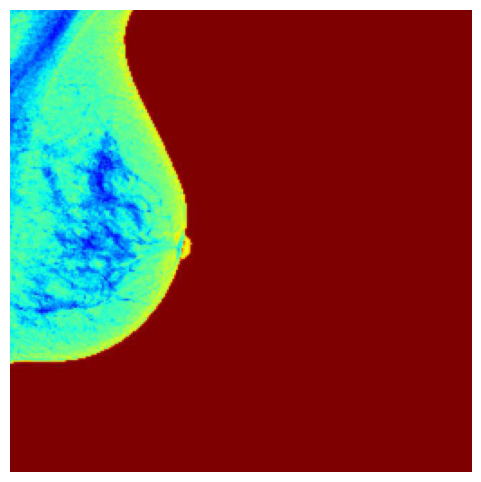

Motion image saved as F:\MLpractrice\ct\output\motion_image3.gif


In [11]:
# Import necessary libraries
import os
from PIL import Image
import imageio
import matplotlib.pyplot as plt

# Define the input folder path for images
folder_path = r'F:\MLpractrice\ct\data\New folder\Breast Cancer\0\3D_Rendering'

# List all files in the directory
image_files = [f for f in os.listdir(folder_path) if f.endswith('.jpg') or f.endswith('.png')]

# Sort the files if necessary (optional, here it assumes sorting by filename)
image_files.sort()

# Take the first 20 images
image_files = image_files[:20]

# Create an empty list to store the images
images = []

# Load each image and append to the images list
for image_file in image_files:
    image_path = os.path.join(folder_path, image_file)
    
    # Open the image using PIL
    img = Image.open(image_path)
    
    # Resize or perform any other transformation if needed (e.g., to make sure all images are the same size)
    img = img.resize((256, 256))  # Example resize, adjust dimensions if needed
    images.append(img)

# Define the output directory and gif path
output_directory = r'F:\MLpractrice\ct\output'
gif_path = os.path.join(output_directory, 'motion_image3.gif')

# Create the output directory if it doesn't exist
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

# Save the images as an animated GIF (motion image)
imageio.mimsave(gif_path, images, duration=0.5)

# Display the gif
plt.figure(figsize=(6, 6))
plt.imshow(images[0])  # Show the first image as a preview
plt.axis('off')
plt.show()

print(f"Motion image saved as {gif_path}")


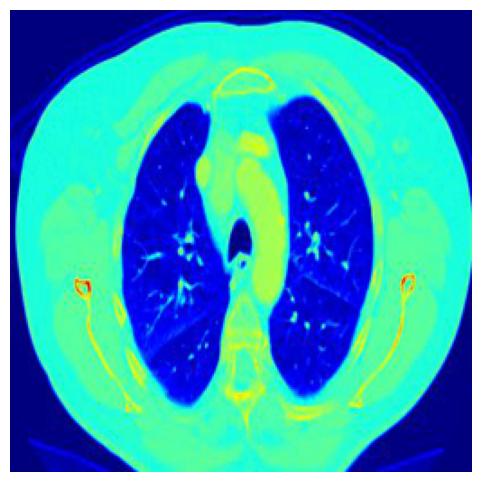

Motion image saved as F:\MLpractrice\ct\output\motion_image2.gif


In [9]:
# Import necessary libraries
import os
from PIL import Image
import imageio
import matplotlib.pyplot as plt

# Define the new input folder path for images
folder_path = r'F:\MLpractrice\ct\data\New folder\Chest CT-Scan images Dataset\data\adenocarcinoma_left.lower.lobe_T2_N0_M0_Ib\3D_Rendering'

# List all files in the directory
image_files = [f for f in os.listdir(folder_path) if f.endswith('.jpg') or f.endswith('.png')]

# Sort the files if necessary (optional, here it assumes sorting by filename)
image_files.sort()

# Take the first 20 images
image_files = image_files[:20]

# Create an empty list to store the images
images = []

# Load each image and append to the images list
for image_file in image_files:
    image_path = os.path.join(folder_path, image_file)
    
    # Open the image using PIL
    img = Image.open(image_path)
    
    # Resize or perform any other transformation if needed (e.g., to make sure all images are the same size)
    img = img.resize((256, 256))  # Example resize, adjust dimensions if needed
    images.append(img)

# Define the output directory and gif path
output_directory = r'F:\MLpractrice\ct\output'
gif_path = os.path.join(output_directory, 'motion_image2.gif')

# Create the output directory if it doesn't exist
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

# Save the images as an animated GIF (motion image)
imageio.mimsave(gif_path, images, duration=0.5)

# Display the gif
plt.figure(figsize=(6, 6))
plt.imshow(images[0])  # Show the first image as a preview
plt.axis('off')
plt.show()

print(f"Motion image saved as {gif_path}")


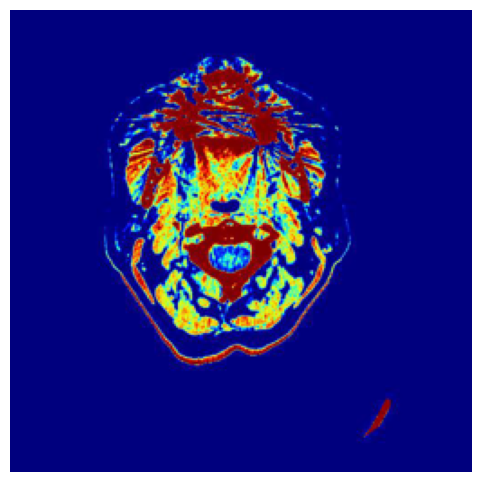

Motion image saved as F:\MLpractrice\ct\output\motion_image.gif


In [10]:
# Import necessary libraries
import os
from PIL import Image
import imageio
import matplotlib.pyplot as plt

# Define the new input folder path for images
folder_path = r'F:\MLpractrice\ct\data\New folder\Computed Tomography (CT) of the Brain\data\aneurysm\3D_Rendering'

# List all files in the directory
image_files = [f for f in os.listdir(folder_path) if f.endswith('.jpg') or f.endswith('.png')]

# Sort the files if necessary (optional, here it assumes sorting by filename)
image_files.sort()

# Take the first 100 images
image_files = image_files[:100]

# Create an empty list to store the images
images = []

# Load each image and append to the images list
for image_file in image_files:
    image_path = os.path.join(folder_path, image_file)
    
    # Open the image using PIL
    img = Image.open(image_path)
    
    # Resize or perform any other transformation if needed (e.g., to make sure all images are the same size)
    img = img.resize((256, 256))  # Example resize, adjust dimensions if needed
    images.append(img)

# Define the output directory and gif path
output_directory = r'F:\MLpractrice\ct\output'
gif_path = os.path.join(output_directory, 'motion_image.gif')

# Create the output directory if it doesn't exist
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

# Save the images as an animated GIF (motion image)
imageio.mimsave(gif_path, images, duration=0.5)

# Display the gif
plt.figure(figsize=(6, 6))
plt.imshow(images[0])  # Show the first image as a preview
plt.axis('off')
plt.show()

print(f"Motion image saved as {gif_path}")


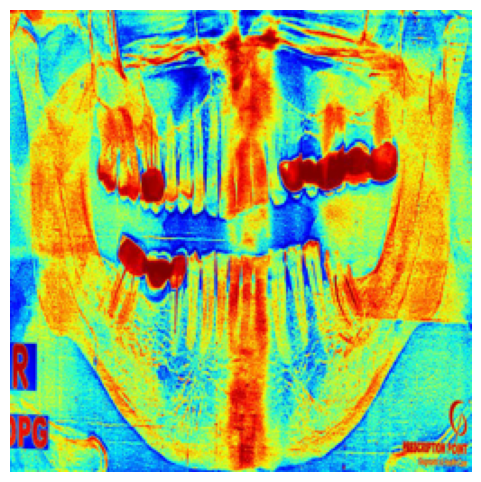

Motion image saved as F:\MLpractrice\ct\output\motion_image4.gif


In [12]:
# Import necessary libraries
import os
from PIL import Image
import imageio
import matplotlib.pyplot as plt

# Define the new input folder path for images
folder_path = r'F:\MLpractrice\ct\data\New folder\Dental OPG Xray Dataset\data\BDC-BDR\3D_Rendering'

# List all files in the directory
image_files = [f for f in os.listdir(folder_path) if f.endswith('.jpg') or f.endswith('.png')]

# Sort the files if necessary (optional, here it assumes sorting by filename)
image_files.sort()

# Take the first 100 images
image_files = image_files[:100]

# Create an empty list to store the images
images = []

# Load each image and append to the images list
for image_file in image_files:
    image_path = os.path.join(folder_path, image_file)
    
    # Open the image using PIL
    img = Image.open(image_path)
    
    # Resize or perform any other transformation if needed (e.g., to make sure all images are the same size)
    img = img.resize((256, 256))  # Example resize, adjust dimensions if needed
    images.append(img)

# Define the output directory and gif path
output_directory = r'F:\MLpractrice\ct\output'
gif_path = os.path.join(output_directory, 'motion_image4.gif')

# Create the output directory if it doesn't exist
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

# Save the images as an animated GIF (motion image)
imageio.mimsave(gif_path, images, duration=0.5)

# Display the gif
plt.figure(figsize=(6, 6))
plt.imshow(images[0])  # Show the first image as a preview
plt.axis('off')
plt.show()

print(f"Motion image saved as {gif_path}")


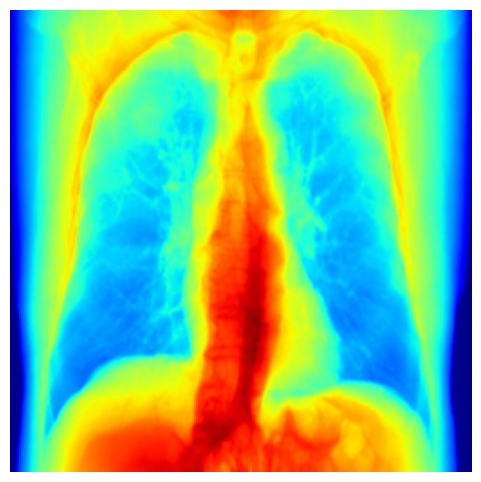

Motion image saved as F:\MLpractrice\ct\output\motion_image5.gif


In [13]:
# Import necessary libraries
import os
from PIL import Image
import imageio
import matplotlib.pyplot as plt

# Define the new input folder path for images
folder_path = r'F:\MLpractrice\ct\data\New folder\Digitally Reconstructed Radiographs (DRR) - Bones\data\3D_Rendering'

# List all files in the directory
image_files = [f for f in os.listdir(folder_path) if f.endswith('.jpg') or f.endswith('.png')]

# Sort the files if necessary (optional, here it assumes sorting by filename)
image_files.sort()

# Take the first 100 images
image_files = image_files[:100]

# Create an empty list to store the images
images = []

# Load each image and append to the images list
for image_file in image_files:
    image_path = os.path.join(folder_path, image_file)
    
    # Open the image using PIL
    img = Image.open(image_path)
    
    # Resize or perform any other transformation if needed (e.g., to make sure all images are the same size)
    img = img.resize((256, 256))  # Example resize, adjust dimensions if needed
    images.append(img)

# Define the output directory and gif path
output_directory = r'F:\MLpractrice\ct\output'
gif_path = os.path.join(output_directory, 'motion_image5.gif')

# Create the output directory if it doesn't exist
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

# Save the images as an animated GIF (motion image)
imageio.mimsave(gif_path, images, duration=0.5)

# Display the gif
plt.figure(figsize=(6, 6))
plt.imshow(images[0])  # Show the first image as a preview
plt.axis('off')
plt.show()

print(f"Motion image saved as {gif_path}")


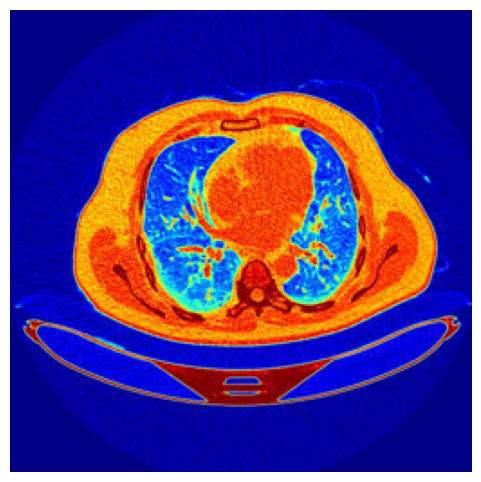

Motion image saved as F:\MLpractrice\ct\output\motion_image6.gif


In [14]:
# Import necessary libraries
import os
from PIL import Image
import imageio
import matplotlib.pyplot as plt

# Define the new input folder path for images
folder_path = r'F:\MLpractrice\ct\data\New folder\The IQ_OTH_NCCD lung cancer dataset\Bengin cases\3D_Rendering'

# List all files in the directory
image_files = [f for f in os.listdir(folder_path) if f.endswith('.jpg') or f.endswith('.png')]

# Sort the files if necessary (optional, here it assumes sorting by filename)
image_files.sort()

# Take the first 100 images
image_files = image_files[:100]

# Create an empty list to store the images
images = []

# Load each image and append to the images list
for image_file in image_files:
    image_path = os.path.join(folder_path, image_file)
    
    # Open the image using PIL
    img = Image.open(image_path)
    
    # Resize or perform any other transformation if needed (e.g., to make sure all images are the same size)
    img = img.resize((256, 256))  # Example resize, adjust dimensions if needed
    images.append(img)

# Define the output directory and gif path
output_directory = r'F:\MLpractrice\ct\output'
gif_path = os.path.join(output_directory, 'motion_image6.gif')

# Create the output directory if it doesn't exist
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

# Save the images as an animated GIF (motion image)
imageio.mimsave(gif_path, images, duration=0.5)

# Display the gif
plt.figure(figsize=(6, 6))
plt.imshow(images[0])  # Show the first image as a preview
plt.axis('off')
plt.show()

print(f"Motion image saved as {gif_path}")


In [15]:
import os

# Define the path to the folder
folder_path = r'F:\MLpractrice\ct\data\New folder'

# Get the list of folder names in the specified directory
folder_names = [name for name in os.listdir(folder_path) if os.path.isdir(os.path.join(folder_path, name))]

print(folder_names)


['Breast Cancer', 'Chest CT-Scan images Dataset', 'Computed Tomography (CT) of the Brain', 'Dental OPG Xray Dataset', 'Digitally Reconstructed Radiographs (DRR) - Bones', 'The IQ_OTH_NCCD lung cancer dataset']
